In [1]:
import jax
import tensorflow_probability.substrates.jax as tfp

from gigalens.jax.inference import ModellingSequence
from gigalens.jax.model import ForwardProbModel, BackwardProbModel
from gigalens.model import PhysicalModel
from gigalens.jax.simulator import LensSimulator
from gigalens.simulator import SimulatorConfig
from gigalens.jax.profiles.mass import epl, shear

import os, sys
sys.path.insert(0, f'{os.environ["HOME"]}/gigalens/src/gigalens_2/jax')
from profiles.light import sersic

from jax import random
import numpy as np
import optax
from jax import numpy as jnp
from matplotlib import pyplot as plt
import corner
import blackjax
import importlib

tfd = tfp.distributions

from laps import LAPS
# from ../nuts/mclmc_alt import MCLMC
# from mams import MAMS

2026-06-13 14:04:05.731959: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1781384645.749580  552112 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1781384645.755404  552112 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1781384645.772969  552112 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1781384645.772985  552112 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1781384645.772989  552112 computation_placer.cc:177] computation placer alr

In [2]:
lens_prior = tfd.JointDistributionSequential(
    [
        tfd.JointDistributionNamed(
            dict(
                theta_E=tfd.LogNormal(jnp.log(1.25), 0.25),
                gamma=tfd.TruncatedNormal(2, 0.25, 1, 3),
                e1=tfd.Normal(0, 0.1),
                e2=tfd.Normal(0, 0.1),
                center_x=tfd.Normal(0, 0.05),
                center_y=tfd.Normal(0, 0.05),
            )
        ),
        tfd.JointDistributionNamed(
            dict(gamma1=tfd.Normal(0, 0.05), gamma2=tfd.Normal(0, 0.05))
        ),
    ]
)
lens_light_prior = tfd.JointDistributionSequential(
    [
        tfd.JointDistributionNamed(
            dict(
                R_sersic=tfd.LogNormal(jnp.log(1.0), 0.15),
                n_sersic=tfd.Uniform(2, 6),
                e1=tfd.TruncatedNormal(0, 0.1, -0.3, 0.3),
                e2=tfd.TruncatedNormal(0, 0.1, -0.3, 0.3),
                center_x=tfd.Normal(0, 0.05),
                center_y=tfd.Normal(0, 0.05),
                Ie=tfd.LogNormal(jnp.log(500.0), 0.3),
            )
        )
    ]
)
source_light_prior = tfd.JointDistributionSequential(
    [
        tfd.JointDistributionNamed(
            dict(
                R_sersic=tfd.LogNormal(jnp.log(0.25), 0.15),
                n_sersic=tfd.Uniform(0.5, 4),
                e1=tfd.TruncatedNormal(0, 0.15, -0.5, 0.5),
                e2=tfd.TruncatedNormal(0, 0.15, -0.5, 0.5),
                center_x=tfd.Normal(0, 0.25),
                center_y=tfd.Normal(0, 0.25),
                Ie=tfd.LogNormal(jnp.log(150.0), 0.5),
            )
        )
    ]
)
prior = tfd.JointDistributionSequential(
    [lens_prior, lens_light_prior, source_light_prior]
)

In [ ]:
from os.path import expanduser
home = expanduser("~/")
gigal_dir = os.path.join(home, 'gigalens/src/gigalens/')
kernel = np.load(gigal_dir + '/assets/psf.npy').astype(np.float32)
sim_config = SimulatorConfig(delta_pix=0.065, num_pix=60, supersample=2, kernel=kernel)
phys_model = PhysicalModel(
    [epl.EPL(50), shear.Shear()],
    [sersic.SersicEllipse(use_lstsq=False)],
    [sersic.SersicEllipse(use_lstsq=False)]
)
lens_sim = LensSimulator(phys_model, sim_config, bs=1)
observed_img = np.load(gigal_dir + '/assets/demo.npy')
prob_model = ForwardProbModel(prior, observed_img, background_rms=0.2, exp_time=100)
model_seq = ModellingSequence(phys_model, prob_model, sim_config)

In [ ]:
# Load pre-computed SVI surrogate (qz) — used only for warm initialization.
# LAPS can also run without qz by passing qz=None (initializes from prior).
qz_data = jnp.load("qz.npz")
qz = tfd.MultivariateNormalTriL(loc=qz_data['loc'], scale_tril=qz_data['scale_tril'])
print("qz distribution reconstructed successfully!")

qz distribution reconstructed successfully!


In [ ]:
# LAPS: replaces MAP + SVI + MCMC in one call.
# Phase 1 (unadjusted): MCLMC dynamics, ensemble step-size adaptation via energy variance.
# Phase 2 (adjusted):   MH-corrected dynamics; step sizes are already tuned so acceptance ≈ 1.
from importlib import reload
import blackjax_laps_wrapper
reload(blackjax_laps_wrapper)

laps_samples = blackjax_laps_wrapper.LAPS(
    model_seq=model_seq,
    qz=qz,
    n_chains=16,
    num_burnin_steps=1000,
    num_results=2000,
    seed=0,
)
print(f"LAPS samples shape: {laps_samples.shape}")

2026-06-13 13:45:15.925059: E external/xla/xla/service/slow_operation_alarm.cc:73] Trying algorithm eng2{k2=1,k3=0} for conv %cudnn-conv-bw-input = (f32[16,1,120,120]{3,2,1,0}, u8[0]{0}) custom-call(%bitcast.26, %bitcast.27), window={size=25x25 pad=12_12x12_12}, dim_labels=bf01_oi01->bf01, custom_call_target="__cudnn$convBackwardInput", metadata={op_name="jit(<unnamed wrapped function>)/jit(main)/jit(shmap_body)/jit(log_prob)/jit(simulate)/conv_general_dilated" source_file="/global/u1/c/chaseg/laps/blackjax_laps.py" source_line=439}, backend_config={"operation_queue_id":"0","wait_on_operation_queues":[],"cudnn_conv_backend_config":{"conv_result_scale":1,"activation_mode":"kNone","side_input_scale":0,"leakyrelu_alpha":0},"force_earliest_schedule":false,"reification_cost":[]} is taking a while...
2026-06-13 13:45:16.804827: E external/xla/xla/service/slow_operation_alarm.cc:140] The operation took 1.879874004s
Trying algorithm eng2{k2=1,k3=0} for conv %cudnn-conv-bw-input = (f32[16,1,120

In [6]:
# MCLMC for comparison (unadjusted, asymptotically biased)
mclmc_samples = MCLMC(model_seq, qz, n_hmc=16, num_burnin_steps=1000, num_results=2000)
print(f"MCLMC samples shape: {mclmc_samples.shape}")

Stage 2 Cov Egval Mean: (0.0037929434329271317+0j), Min: (2.678252712939866e-07+0j), Max: (0.05303768441081047+0j)
Burnin Time: 74.15400501410477
Sampling took 46.57054799795151 s
MCLMC samples shape: (2000, 16, 22)


In [7]:
# MAMS for comparison (adjusted from the start)
mams_samples = MAMS(
    model_seq=model_seq,
    qz=qz,
    n_hmc=16,
    mass_matrix_adapt=False,
    num_burnin_steps=1000,
    num_results=2000,
)
print(f"MAMS samples shape: {mams_samples.shape}")

Burnin Time: 18.17433532886207
Sampling took 28.07672711298801 s
MAMS samples shape: (2000, 16, 22)


In [8]:
# ESS and R-hat diagnostics
ESS_laps  = blackjax.diagnostics.effective_sample_size(laps_samples,  chain_axis=1, sample_axis=0)
ESS_mclmc = blackjax.diagnostics.effective_sample_size(mclmc_samples, chain_axis=1, sample_axis=0)
ESS_mams  = blackjax.diagnostics.effective_sample_size(mams_samples,  chain_axis=1, sample_axis=0)

print("=== Effective Sample Size ===")
print(f"LAPS:  mean={np.mean(ESS_laps):.1f}  min={float(jnp.min(ESS_laps)):.1f}")
print(f"MCLMC: mean={np.mean(ESS_mclmc):.1f}  min={float(jnp.min(ESS_mclmc)):.1f}")
print(f"MAMS:  mean={np.mean(ESS_mams):.1f}  min={float(jnp.min(ESS_mams)):.1f}")

Rhat_laps  = blackjax.diagnostics.potential_scale_reduction(laps_samples,  chain_axis=1, sample_axis=0)
Rhat_mclmc = blackjax.diagnostics.potential_scale_reduction(mclmc_samples, chain_axis=1, sample_axis=0)
Rhat_mams  = blackjax.diagnostics.potential_scale_reduction(mams_samples,  chain_axis=1, sample_axis=0)

print("=== R-hat ===")
print(f"LAPS:  mean={np.mean(Rhat_laps):.4f}  max={float(jnp.max(Rhat_laps)):.4f}")
print(f"MCLMC: mean={np.mean(Rhat_mclmc):.4f}  max={float(jnp.max(Rhat_mclmc)):.4f}")
print(f"MAMS:  mean={np.mean(Rhat_mams):.4f}  max={float(jnp.max(Rhat_mams)):.4f}")

=== Effective Sample Size ===
LAPS:  mean=5166.8  min=1260.0
MCLMC: mean=3458.3  min=1665.0
MAMS:  mean=4138.7  min=329.5
=== R-hat ===
LAPS:  mean=1.0020  max=1.0064
MCLMC: mean=1.0028  max=1.0075
MAMS:  mean=1.0065  max=1.0151


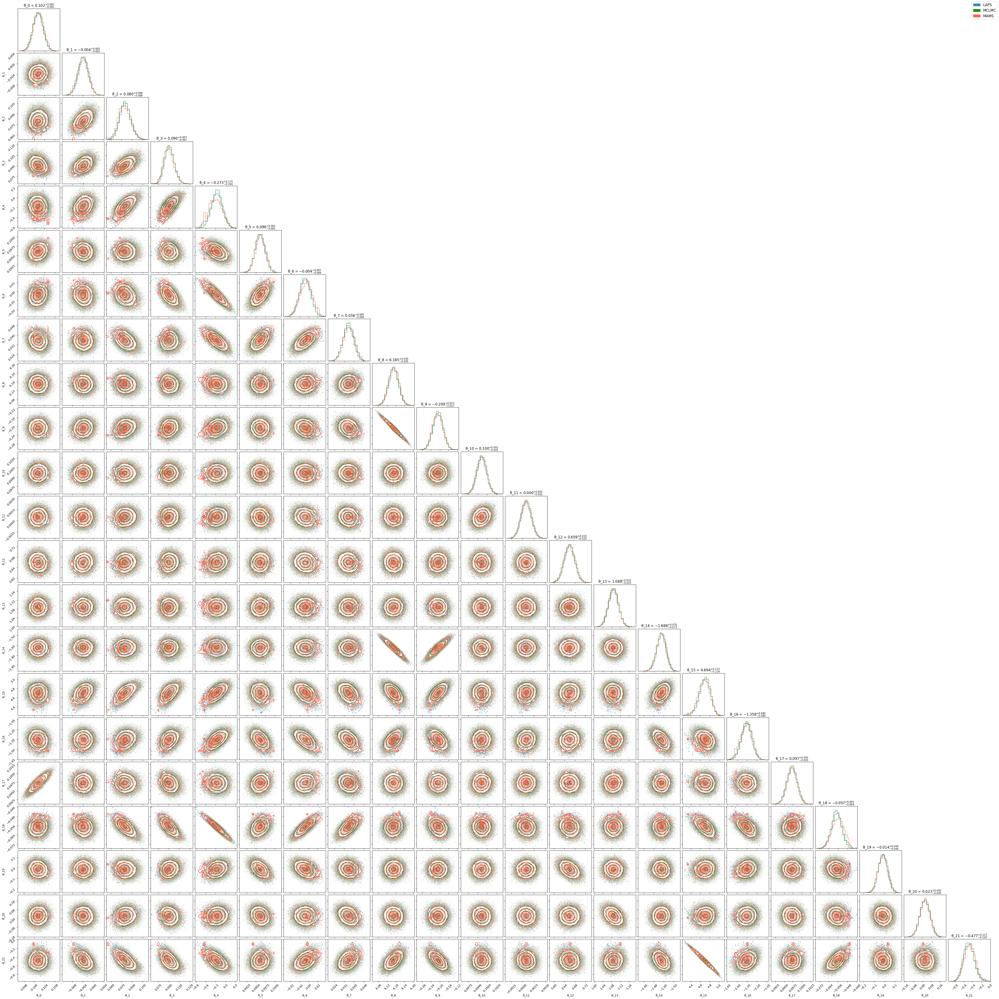

Saved laps_corner.png


In [9]:
import matplotlib.patches as mpatches

laps_flat  = np.array(laps_samples).reshape(-1,  laps_samples.shape[-1])
mclmc_flat = np.array(mclmc_samples).reshape(-1, mclmc_samples.shape[-1])
mams_flat  = np.array(mams_samples).reshape(-1,  mams_samples.shape[-1])

labels = [f'θ_{i}' for i in range(laps_flat.shape[1])]

fig = corner.corner(
    laps_flat,
    labels=labels,
    show_titles=True,
    title_fmt='.3f',
    hist_kwargs={'density': True},
    color='steelblue',
)
corner.corner(mclmc_flat, fig=fig, color='forestgreen', hist_kwargs={'density': True})
corner.corner(mams_flat,  fig=fig, color='tomato',      hist_kwargs={'density': True})

handles = [
    mpatches.Patch(color='steelblue',   label='LAPS'),
    mpatches.Patch(color='forestgreen', label='MCLMC'),
    mpatches.Patch(color='tomato',      label='MAMS'),
]
fig.legend(handles=handles, loc='upper right', fontsize=12)
fig.savefig('laps_corner.png', dpi=150, bbox_inches='tight')
plt.show()
print("Saved laps_corner.png")